# **UNIDAD TEMÁTICA IV: Procesamiento de Imágenes**

Carga y almacenamiento de imágenes. Atributos. Redimensionamiento. Recortes. Rotación y espejado. Mezclado y unión de imágenes. Aplicación de filtros.

<font color='blue'>Pillow, OpenCV, Scikit Image</font>


"En 1911, un artículo de un periódico discutía sobre el periodismo y la publicidad, y citando al director del periódico Tess Flandes, apareció la siguiente expresión: **Una imagen vale más que mil palabras**"


El procesamiento de imágenes digitales es un conjunto de técnicas que se aplican a las imágenes con el objetivo de extraer caracteristicas o información de la imágen, mejorar la calidad, facilitar la búsqueda de información, hacerlas más "bonitas", hacer memes 🤣​, etc... tiene múltiples aplicaciones en distintos procesos tanto científicos como industriales o de operaciones, se usa en la medicina, inteligencia artificial, agricultura, entre otros.

Que es una imagen?

<img src="https://miro.medium.com/max/720/1*YzvaXyVKDdZVAglR_itCCA.png" width="400"/>

Las computadoras (tablets, telefonos, relojes, etc) sólo entienden los datos en forma de números. Estos números suelen almacenarse como escalares, vectores o en matrices (y arrays). Estos números también pueden representar literalmente CUALQUIER cosa. Sin embargo, siguen siendo números.

La PCs descomponen una imagen en tres canales. Una vez hecho esto, estos canales se convierten en una matriz tridimensional

<img src="https://miro.medium.com/max/720/1*jsPHpueq_PAPRH5KVA2VMw.png" width="400"/>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Configuracion necesaria de pyplot para ver las imagenes en escala de grises
plt.rcParams['image.cmap'] = 'gray'

In [ ]:
# Tamaño de la matriz a visualizar
size=(20,30)

# Una matriz de ceros
imagen_negra = np.zeros(size)
imagen_negra

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0

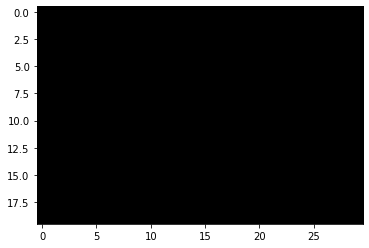

In [ ]:
# Visualizamos la matriz
# Se ve como una imagen negra, ya que todos los elementos (pixeles) tienen intensidad 0
plt.imshow(imagen_negra, vmin=0, vmax=1)
# Es necesario indicar vmin y vmax para que pyplot sepa que el minimo es 0 y el maximo 1
# Solo imagenes en escala de grises

In [ ]:
# IMAGEN BLANCA
# Una matriz de unos.
imagen_blanca = np.ones(size)
print(imagen_blanca)

[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
  1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 

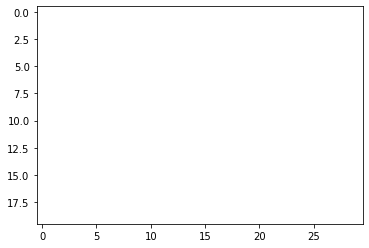

In [ ]:
# Visualizamos la matriz
# Se ve como una imagen blanca, ya que todos los elementos (pixeles) tienen intensidad 1
plt.imshow(imagen_blanca, vmin=0, vmax=1)

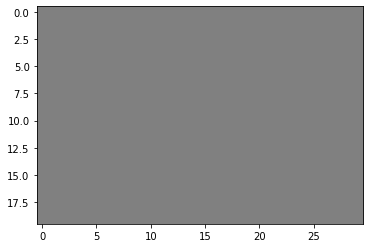

In [ ]:
# Creamos otra figura para mostrar la imagen (sino el proximo imshow sobreescribe al anterior)
plt.figure()

# IMAGEN GRIS
# Una matriz con valor 0.5 en todos sus elementos
imagen_gris = np.ones(size)*0.5

# Visualizamos la matriz
# Se ve como una imagen gris, ya que todos los elementos (pixeles) tienen intensidad 0.5
plt.imshow(imagen_gris, vmin=0, vmax=1)

In [ ]:
# IMAGEN ALEATORIA
# Una matriz con valor aleatorio
imagen_aleatoria = np.random.rand(size[0],size[1])
imagen_aleatoria

array([[0.49942799, 0.80315934, 0.0073318 , 0.66104932, 0.32680339,
        0.39617074, 0.18747504, 0.27580597, 0.05361587, 0.85221079,
        0.34790207, 0.40360243, 0.63631491, 0.77777427, 0.90363638,
        0.0100782 , 0.04095229, 0.2147376 , 0.40057364, 0.36491843,
        0.88499778, 0.62181833, 0.57974038, 0.31935535, 0.38155019,
        0.06469078, 0.78508245, 0.77994914, 0.40655931, 0.94863487],
       [0.58753941, 0.86570953, 0.84019461, 0.2070392 , 0.18566696,
        0.18511376, 0.02879931, 0.86889659, 0.89096166, 0.37420724,
        0.59130434, 0.76963978, 0.15635258, 0.66392344, 0.17589335,
        0.87545866, 0.59366878, 0.12480737, 0.27420055, 0.038667  ,
        0.77668331, 0.08682378, 0.24678223, 0.40207625, 0.83497624,
        0.15265582, 0.68170224, 0.15374159, 0.22312759, 0.81052347],
       [0.69098117, 0.81354774, 0.06569765, 0.15363532, 0.38241397,
        0.00198903, 0.85303323, 0.7463523 , 0.17516947, 0.03930724,
        0.68767034, 0.71684008, 0.43678512, 0.

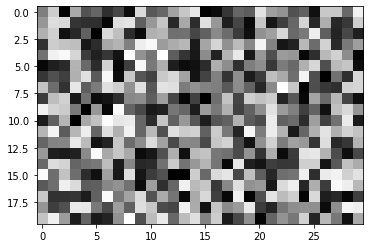

In [ ]:
plt.figure()

# Visualizamos la matriz
plt.imshow(imagen_aleatoria, vmin=0, vmax=1)

Y las imagénes / fotos a color, que tienen 3 (o más) bandas???

Ahora veremos algunos bibliotecas para procesar imágenes en Python:

In [ ]:
# Para leer imagenes de Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Path de la carpeta donde tenemos las imágenes
folder = "/content/drive/My Drive/UPSO/Clases/DataPandas/imgs/" #@param {type:"string"}

## <font color='blue'>OpenCV</font>

OpenCV (Open Computer Vision) es una biblioteca libre de visión artificial originalmente desarrollada por Intel en C++, orientado a objetos y con alta eficiencia computacional. Su API (Interfaz de programación de aplicaciones) es C++ pero incluye conectores para otros lenguajes como Python. Su primera versión se lanzó en 1999 y sigue siendo una biblioteca popular para procesamiento de imágenes.

In [ ]:
import cv2 # pip install

# Para visualizar en Colab
from google.colab.patches import cv2_imshow # cv.imshow

In [ ]:
# Leer imagen
img = cv2.imread(folder + 'baires.jpg', cv2.IMREAD_COLOR)
img

array([[[235, 192,   0],
        [235, 192,   0],
        [235, 192,   0],
        ...,
        [224, 203, 175],
        [225, 204, 176],
        [226, 205, 177]],

       [[235, 192,   0],
        [235, 192,   0],
        [235, 192,   0],
        ...,
        [225, 204, 176],
        [225, 204, 176],
        [226, 205, 177]],

       [[235, 192,   0],
        [235, 192,   0],
        [235, 192,   0],
        ...,
        [223, 205, 176],
        [224, 206, 177],
        [224, 206, 177]],

       ...,

       [[ 27,  22,   7],
        [ 24,  19,   4],
        [ 21,  16,   1],
        ...,
        [  0,  16,  48],
        [  0,  17,  53],
        [  0,  21,  59]],

       [[ 23,  18,   3],
        [ 20,  15,   0],
        [ 18,  13,   0],
        ...,
        [ 21,  54,  87],
        [ 31,  69, 104],
        [ 36,  78, 115]],

       [[ 21,  16,   1],
        [ 19,  14,   0],
        [ 18,  13,   0],
        ...,
        [ 64, 103, 135],
        [ 76, 121, 158],
        [ 82, 131, 169]]

In [ ]:
# Tamaño de la imagén (ancho, alto, canales o bandas)
img.shape

(564, 750, 3)

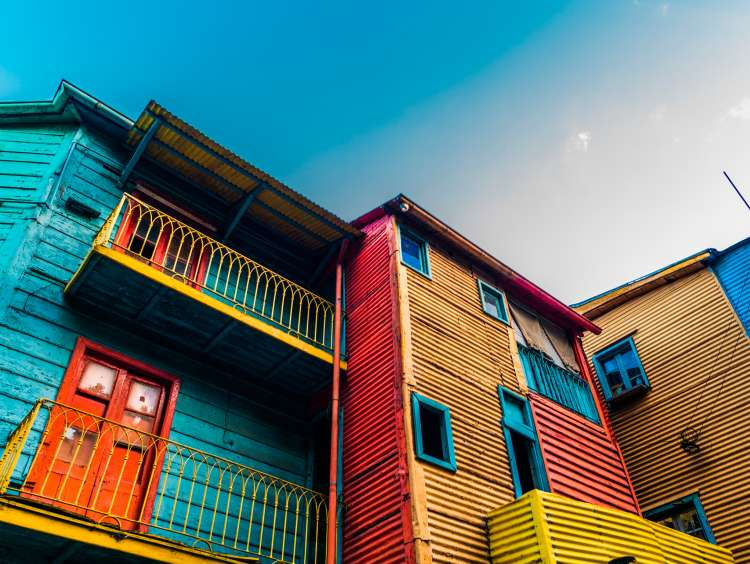

In [ ]:
# Para otros IDEs
#cv2.imshow("image", img)

# Para Colab
cv2_imshow(img)

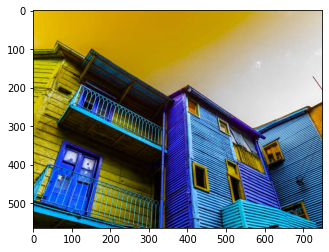

In [ ]:
# Visualizar con matplotlib
import matplotlib.pyplot as plt

plt.imshow(img)

Noten la diferencia en los colores de las imágenes leídas por la biblioteca cv2 y matplotlib. Sucede porque cv2 usa el formato de color **BGR** y matplotlib usa el formato de color **RGB**.

Para convertir BGR a RGB, usamos una función:

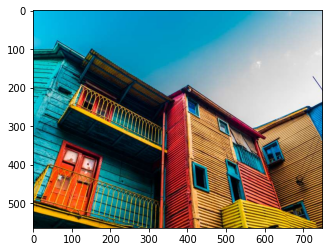

In [ ]:
img = cv2.imread(folder + 'baires.jpg')

# Convertir de BGR a RGB
RGB_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

plt.imshow(RGB_img)

**Entendiendo los espacios de colores:**

Los espacios de color son una forma de representar los canales de color presentes en la imagen que le dan ese tono particular. Hay varios espacios de color diferentes y cada uno tiene su propio significado. Algunos de los espacios de color más populares son **RGB** (rojo, verde, azul), **CMYK** (cian, magenta, amarillo, negro), **HSV** (tono, saturación, valor), etc.

Espacio de color **BGR**: El espacio de color por defecto de OpenCV es RGB. Sin embargo, en realidad almacena el color en el formato BGR. Es un modelo de color aditivo donde las diferentes intensidades de Azul, Verde y Rojo dan diferentes tonos de color.

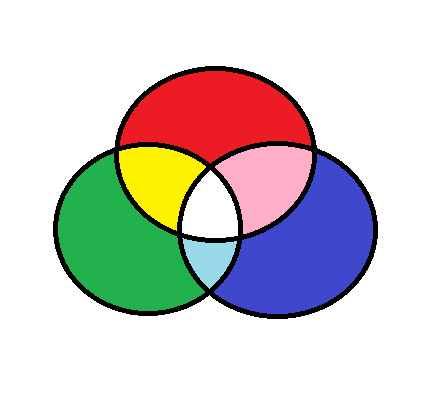

In [ ]:
colors = cv2.imread(folder + 'rgb_paint.png')
cv2_imshow(colors)

In [ ]:
# Separamos las bandas / canales
B, G, R = cv2.split(colors)
B

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [ ]:
# Función para ver el arreglo de numpy completo (sin truncar)
np.set_printoptions(threshold=np.inf)
print(B)

[[255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255 255
  255 255 255 255 255 255 255 255 255 

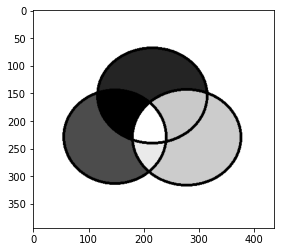

In [ ]:
# Graficamos el canal B (Blue)
plt.imshow(B)

**Histograma:**

Un histograma de una imagen es la interpretación gráfica de los valores de intensidad de píxeles de la imagen. Puede interpretarse como la estructura de datos que almacena las frecuencias de todos los niveles de intensidad de píxeles en la imagen. El eje X representa los niveles de intensidad de píxeles de la imagen. El nivel de intensidad suele oscilar entre 0 y 255.

<img src="http://www.doc.gold.ac.uk/~mas02fl/MSC101/ImageProcess/HIPR/histgram_files/histb.gif" width="400"/>

Para una imagen en escala de grises, solo hay un histograma, mientras que una imagen en color RGB tendrá tres histogramas 2-D, uno para cada color. El eje Y del histograma indica la frecuencia o el número de píxeles que tienen valores de intensidad específicos.

Para este ejemplo, vamos a trabajar con imágenes en escala de grises

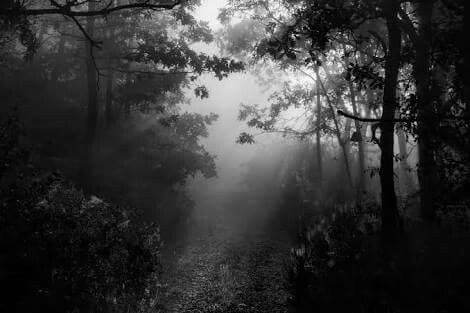

In [ ]:
img = cv2.imread(folder + 'oscura.jpg', 0) # Truco ,0: blanco y negro
cv2_imshow(img)

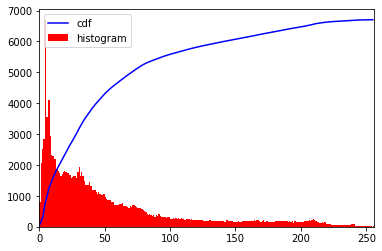

In [ ]:
hist,bins = np.histogram(img.flatten(),256,[0,256])

# cumulative distribution function
cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

plt.plot(cdf_normalized, color = 'b')
plt.hist(img.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

La **ecualización de histograma** es una técnica de procesamiento de imágenes que ajusta el contraste de una imagen utilizando su histograma. Para mejorar el contraste de la imagen, distribuye los valores de intensidad de píxeles más frecuentes o extiende el rango de intensidad de la imagen. Al lograr esto, la ecualización del histograma permite que las áreas de la imagen con menor contraste obtengan un mayor contraste.

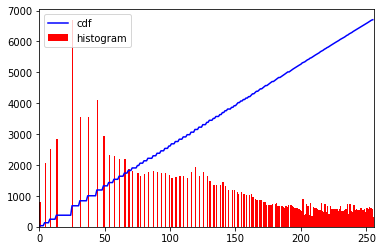

In [ ]:
# Ecualizacion del histograma
equ = cv2.equalizeHist(img)

# Histograma
hist,bins = np.histogram(equ.flatten(),256,[0,256])

cdf = hist.cumsum()
cdf_normalized = cdf * float(hist.max()) / cdf.max()

# Graficando
plt.plot(cdf_normalized, color = 'b')
plt.hist(equ.flatten(),256,[0,256], color = 'r')
plt.xlim([0,256])
plt.legend(('cdf','histogram'), loc = 'upper left')
plt.show()

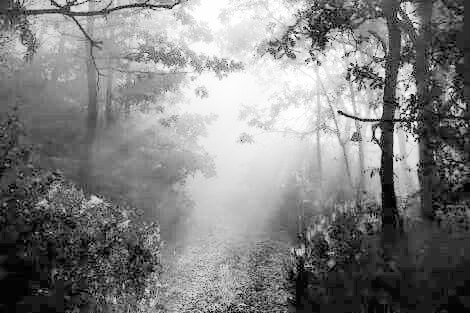

In [ ]:
cv2_imshow(equ)

La ecualización de histograma se puede utilizar cuando tiene imágenes que parecen desteñidas porque no tienen suficiente contraste. En tales fotografías, las áreas claras y oscuras se mezclan creando una imagen más plana que carece de luces y sombras.


**Operaciones aritméticas en imágenes:**

Se pueden aplicar a las imágenes operaciones aritméticas (como la suma, la resta) y las operaciones a nivel de bits (AND, OR, NOT, XOR). Estas operaciones pueden ser útiles para mejorar las propiedades de las imágenes... Se pueden aplicar muchas más operaciones para aclarar, umbralizar, dilatar, etc las imágenenes.

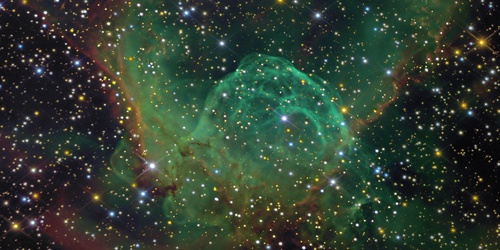

In [ ]:
image1 = cv2.imread(folder + 'img1.jpg')
image2 = cv2.imread(folder + 'img2.jpg')

cv2_imshow(image2)

**Sumar dos imágenes:**

> sum = α⋅image1 + β⋅image2 + γ

Nota: Dado que estamos agregando image1 a image2, ambos deben tener el mismo tamaño (ancho y alto)


Usamos la función **cv2.addWeighted** (añadir pesos)
dst = cv.addWeighted(image1, alpha, image2, beta, gamma)

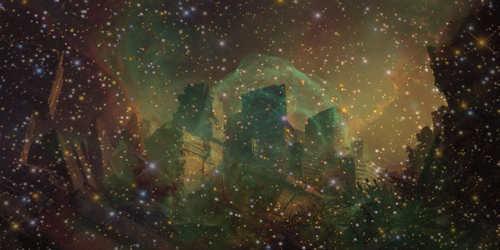

In [ ]:
suma = cv2.addWeighted(image1, 0.5, image2, 0.5, 0)
cv2_imshow(suma)

In [ ]:
# Guardar la imágen
cv2.imwrite("suma.jpg", suma)

True

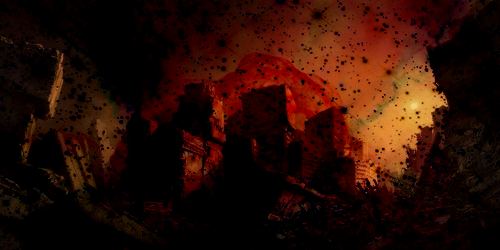

In [ ]:
# Resta
resta = cv2.subtract(image1, image2)
cv2_imshow(resta)

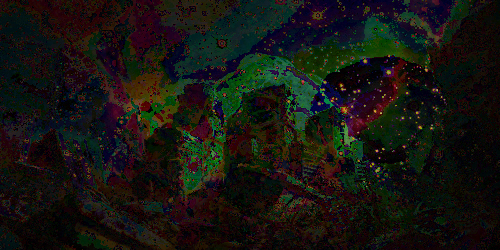

In [ ]:
# AND
img_and = cv2.bitwise_and(image2, image1, mask = None)
cv2_imshow(img_and)

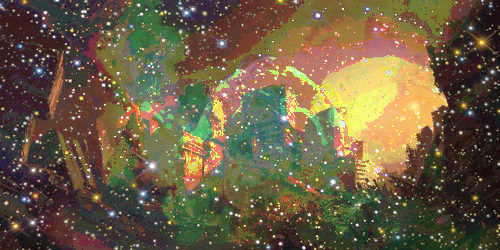

In [ ]:
# OR
img_or = cv2.bitwise_or(image2, image1, mask = None)
cv2_imshow(img_or)

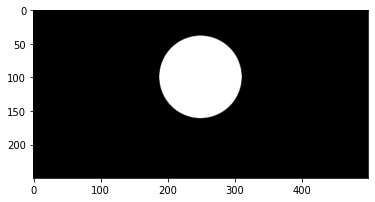

In [ ]:
black_white = cv2.imread(folder + 'black_white.png')
circle = cv2.imread(folder + 'circle.png')

plt.imshow(circle)

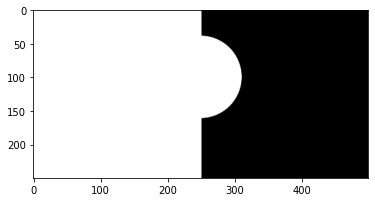

In [ ]:
bw_op = cv2.bitwise_or(black_white, circle, mask = None)
plt.imshow(bw_op)

## <font color='blue'>Pillow</font>

Pillow es una biblioteca gratuita y de código abierto (como la mayoria de las bibliotecas de Python) con funciones que permiten abrir, manipular y guardar muchos formatos de archivo de imagen diferentes (jpeg, png, bmp, gif, ppm y tiff)

In [ ]:
!pip install pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from PIL import Image #Importamos la función Image del paquete PIL

In [ ]:
#Abrimos la imagen
img = Image.open(folder + 'baires.jpg')
img #img.show() en otros entornos (IDEs)

UnidentifiedImageError: ignored

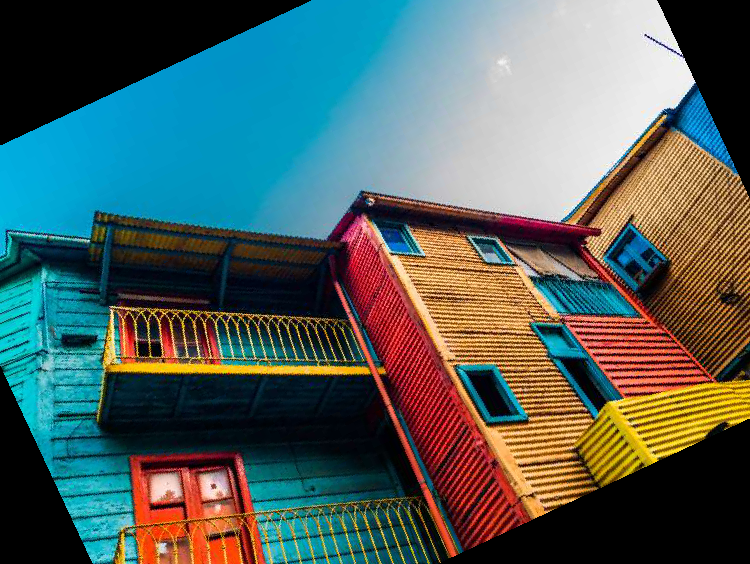

In [ ]:
# Función rotar
nuevaimg = img.rotate(25)
nuevaimg

In [ ]:
# Tamaño de la imagen
img.size

(750, 564)

(300, 150)


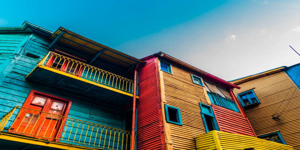

In [ ]:
# Redimensionar imagen
resize_img = img.resize((300, 150))
print(resize_img.size)
resize_img

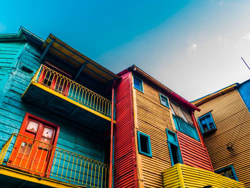

In [ ]:
ancho, alto = img.size
resize2_img = img.resize((ancho//3, alto//3))
resize2_img

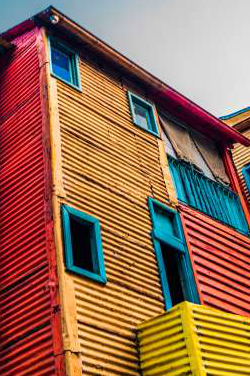

In [ ]:
# Recortar imagén (tamaño: (750, 564))
izquierda = 350
arriba = alto / 3
derecha = 600
abajo = 3 * alto / 3

crop_img = img.crop((izquierda, arriba, derecha, abajo))
crop_img

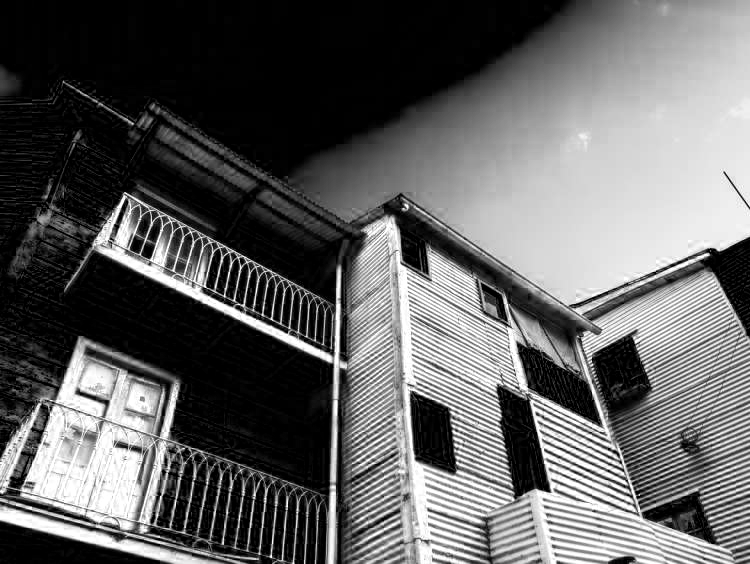

In [ ]:
#Obtenemos los canales RGB de la imagen
r,g,b = img.split()
r

Cambiando secuencia de colores: Aquí cambiamos el orden del R G B (Red, Green, Blue) a B R G

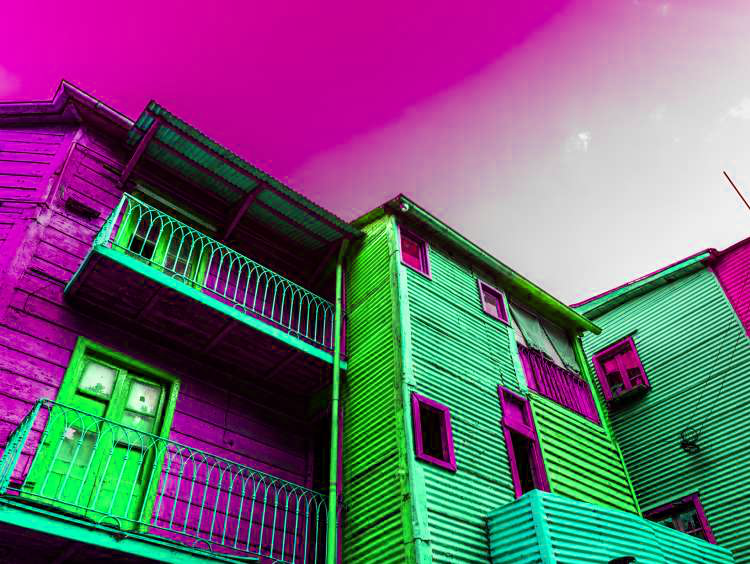

In [ ]:
#Obtenemos los canales RGB de la imagen
r,g,b = img.split()

#Cambiamos el orden de los canales
nuevaimg = Image.merge("RGB", (b, r, g))

nuevaimg

**Trabajando con Filtros:**

El método Image.filter() utilizará las técnicas de filtrado aplicado a las imágenes; veamos algunos ejemplos.

NOTA: Ahora debemos importar tambien el paquete ImageFilter de la librearía PIL.

In [ ]:
#Ahora importamos 'ImageFilter" para los filtros
from PIL import Image,ImageFilter

madryn = Image.open(folder + 'madryn.jpg')
madryn

UnidentifiedImageError: ignored

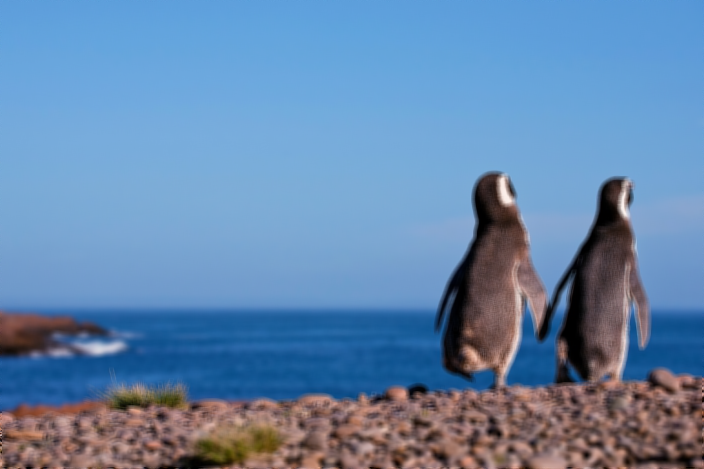

In [ ]:
#Filtro de Blur (Desenfoque)
madryn_blur = madryn.filter(ImageFilter.BLUR)
madryn_blur

Se puede desenfocar una imagen reduciendo el nivel de ruido en la imagen aplicando un filtro.

Con el filtro BoxBlur usamos 'radio' como parámetro. El radio es directamente proporcional al valor de desenfoque.

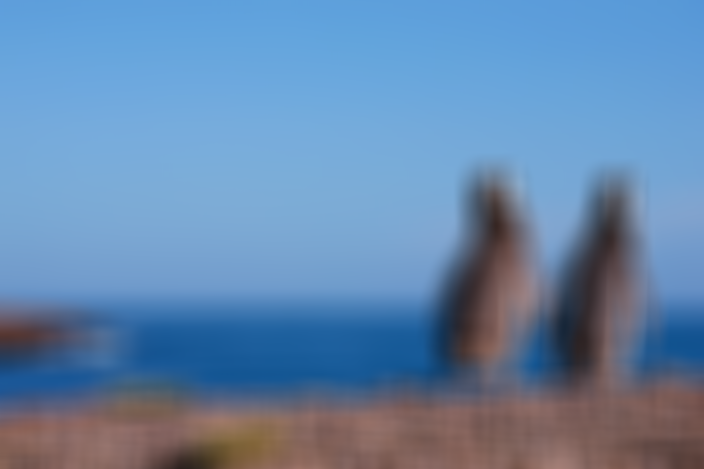

In [ ]:
#Filtro de BoxBlur
madryn_boxblur = madryn.filter(ImageFilter.BoxBlur(20))
madryn_boxblur

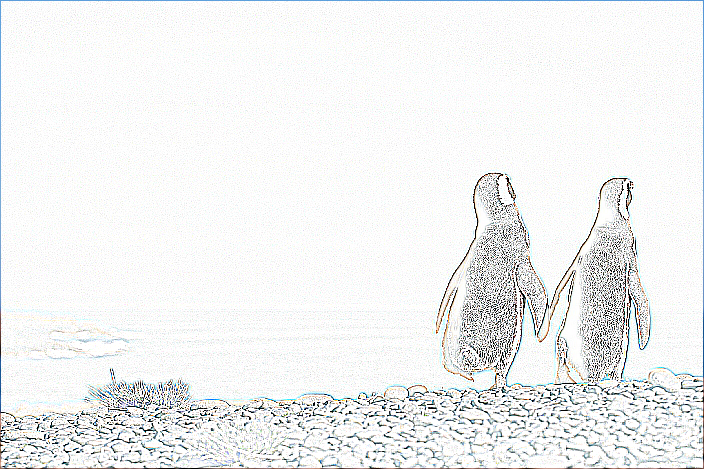

In [ ]:
#Filtro CONTOUR (Contorno, busca lineas)
madryn_contour = madryn.filter(ImageFilter.CONTOUR)
madryn_contour

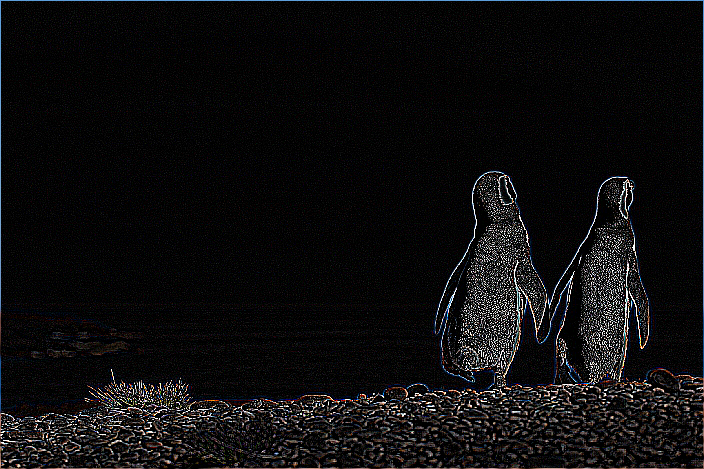

In [ ]:
# Filtro FIND_EDGES (encontrar bordes)
madryn_edges = madryn.filter(ImageFilter.FIND_EDGES)
madryn_edges

Guardar los resultados en una nueva imagen


In [ ]:
madryn_edges.save('madryn_edges.jpg')

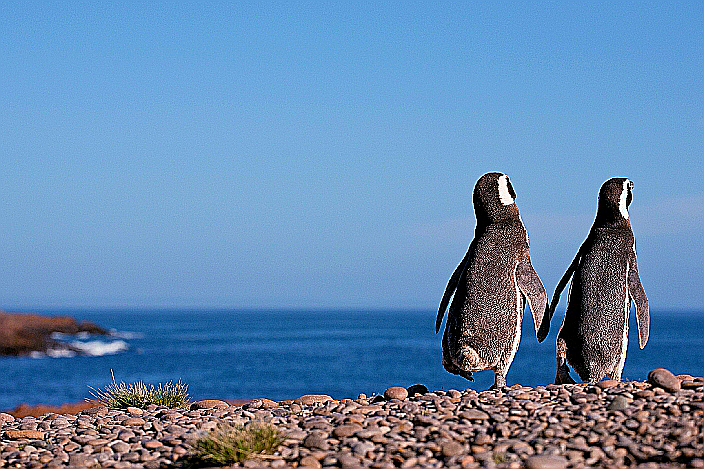

In [ ]:
# Filtro EDGE_ENHANCE (encontrar bordes)
madryn_edge_enhance = madryn.filter(ImageFilter.EDGE_ENHANCE)
madryn_edge_enhance

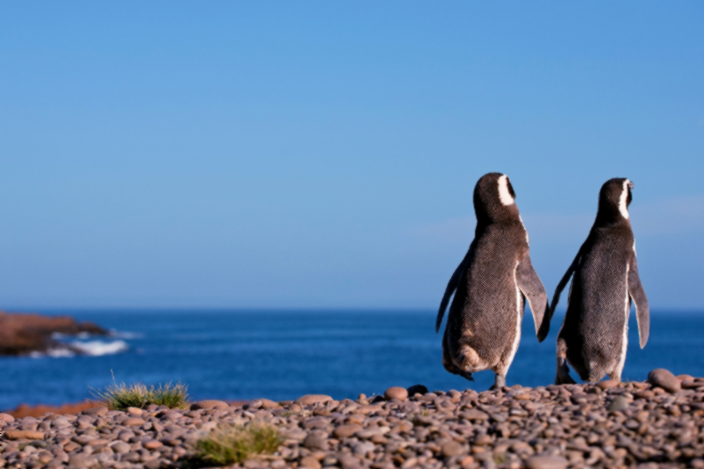

In [ ]:
# Filtro SMOOTH (suavizar)
madryn_smooth = madryn.filter(ImageFilter.SMOOTH)
madryn_smooth

Buscar otros filtros de Pillow:

DETAIL, EDGE_ENHANCE_MORE, EMBOSS, SHARPEN

## <font color='blue'>Scikit-Image</font>

Scikit-image es una biblioteca de procesamiento de imágenes de código abierto para el lenguaje de programación Python. Incluye algoritmos de segmentación, transformaciones geométricas, manipulación del espacio de color, análisis, filtrado, morfología, detección de características y más.

In [ ]:
import skimage.io as io
from skimage.color import rgb2gray

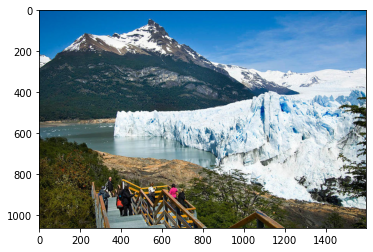

In [ ]:
calafate = io.imread(folder + 'calafate.jpg')
plt.imshow(calafate)

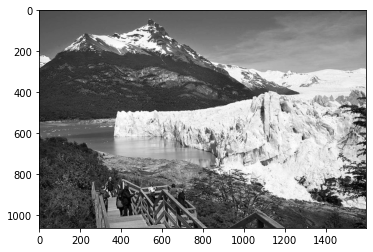

In [ ]:
grayscale = rgb2gray(calafate)
plt.imshow(grayscale)

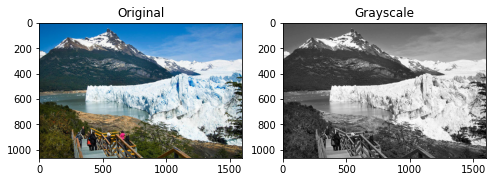

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# numpy.ravel() devuelve una matriz aplanada (fila) contigua con todos los elementos de la matriz de entrada y con el mismo tipo
ax = axes.ravel()

ax[0].imshow(calafate)
ax[0].set_title("Original")

ax[1].imshow(grayscale, cmap=plt.cm.gray)
ax[1].set_title("Grayscale")

plt.show()

Filtros:

Recuerden que la img en esencia es un arreglo de números

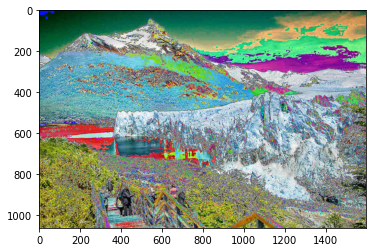

In [ ]:
multi = 3 * calafate
plt.imshow(multi)

In [ ]:
calafate.max()

255

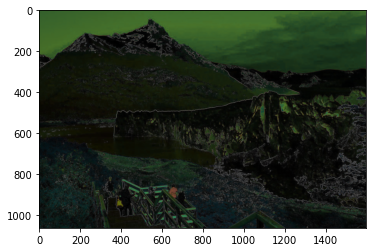

In [ ]:
from skimage import filters

# Sobel es un filtro ampliamente utilizado en algoritmos de detección de bordes
sobel = filters.sobel(calafate)
plt.imshow(sobel)

In [ ]:
# Guardamos la imagen generada
io.imsave("calafate_sobel.png", sobel)

Algunos ejemplos para estudiar: https://scikit-image.org/docs/dev/auto_examples/

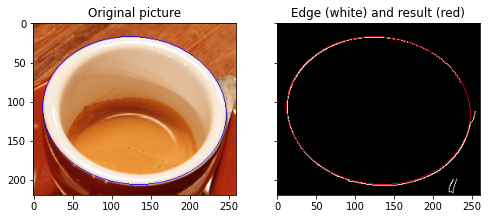

In [ ]:
import matplotlib.pyplot as plt

from skimage import data, color, img_as_ubyte
from skimage.feature import canny
from skimage.transform import hough_ellipse
from skimage.draw import ellipse_perimeter

# Load picture, convert to grayscale and detect edges
image_rgb = data.coffee()[0:220, 160:420]
image_gray = color.rgb2gray(image_rgb)
edges = canny(image_gray, sigma=2.0,
              low_threshold=0.55, high_threshold=0.8)

# Perform a Hough Transform
# The accuracy corresponds to the bin size of a major axis.
# The value is chosen in order to get a single high accumulator.
# The threshold eliminates low accumulators
result = hough_ellipse(edges, accuracy=20, threshold=250,
                       min_size=100, max_size=120)
result.sort(order='accumulator')

# Estimated parameters for the ellipse
best = list(result[-1])
yc, xc, a, b = [int(round(x)) for x in best[1:5]]
orientation = best[5]

# Draw the ellipse on the original image
cy, cx = ellipse_perimeter(yc, xc, a, b, orientation)
image_rgb[cy, cx] = (0, 0, 255)
# Draw the edge (white) and the resulting ellipse (red)
edges = color.gray2rgb(img_as_ubyte(edges))
edges[cy, cx] = (250, 0, 0)

fig2, (ax1, ax2) = plt.subplots(ncols=2, nrows=1, figsize=(8, 4),
                                sharex=True, sharey=True)

ax1.set_title('Original picture')
ax1.imshow(image_rgb)

ax2.set_title('Edge (white) and result (red)')
ax2.imshow(edges)

plt.show()

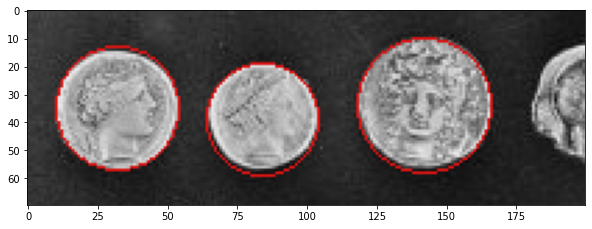

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, color
from skimage.transform import hough_circle, hough_circle_peaks
from skimage.feature import canny
from skimage.draw import circle_perimeter
from skimage.util import img_as_ubyte


# Load picture and detect edges
image = img_as_ubyte(data.coins()[160:230, 70:270])
edges = canny(image, sigma=3, low_threshold=10, high_threshold=50)


# Detect two radii
hough_radii = np.arange(20, 35, 2)
hough_res = hough_circle(edges, hough_radii)

# Select the most prominent 3 circles
accums, cx, cy, radii = hough_circle_peaks(hough_res, hough_radii,
                                           total_num_peaks=3)

# Draw them
fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(10, 4))
image = color.gray2rgb(image)
for center_y, center_x, radius in zip(cy, cx, radii):
    circy, circx = circle_perimeter(center_y, center_x, radius,
                                    shape=image.shape)
    image[circy, circx] = (220, 20, 20)

ax.imshow(image, cmap=plt.cm.gray)
plt.show()

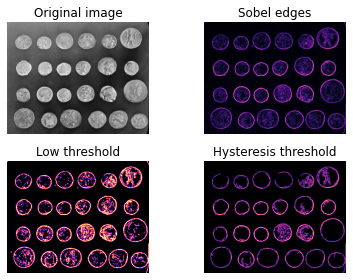

In [ ]:
import matplotlib.pyplot as plt
from skimage import data, filters

fig, ax = plt.subplots(nrows=2, ncols=2)

image = data.coins()
edges = filters.sobel(image)

low = 0.1
high = 0.35

lowt = (edges > low).astype(int)
hight = (edges > high).astype(int)
hyst = filters.apply_hysteresis_threshold(edges, low, high)

ax[0, 0].imshow(image, cmap='gray')
ax[0, 0].set_title('Original image')

ax[0, 1].imshow(edges, cmap='magma')
ax[0, 1].set_title('Sobel edges')

ax[1, 0].imshow(lowt, cmap='magma')
ax[1, 0].set_title('Low threshold')

ax[1, 1].imshow(hight + hyst, cmap='magma')
ax[1, 1].set_title('Hysteresis threshold')

for a in ax.ravel():
    a.axis('off')

plt.tight_layout()

plt.show()

/usr/local/lib/python3.7/dist-packages/skimage/io/_plugins/matplotlib_plugin.py:150: UserWarning: Float image out of standard range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


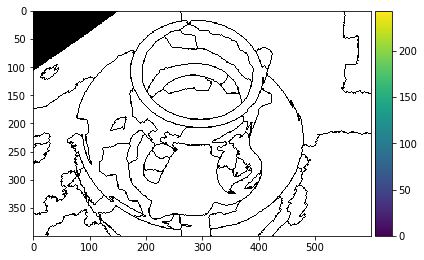

In [ ]:
from skimage import data, io, segmentation, color
from skimage.future import graph
import numpy as np


def _weight_mean_color(graph, src, dst, n):
    """Callback to handle merging nodes by recomputing mean color.

    The method expects that the mean color of `dst` is already computed.

    Parameters
    ----------
    graph : RAG
        The graph under consideration.
    src, dst : int
        The vertices in `graph` to be merged.
    n : int
        A neighbor of `src` or `dst` or both.

    Returns
    -------
    data : dict
        A dictionary with the `"weight"` attribute set as the absolute
        difference of the mean color between node `dst` and `n`.
    """

    diff = graph.nodes[dst]['mean color'] - graph.nodes[n]['mean color']
    diff = np.linalg.norm(diff)
    return {'weight': diff}


def merge_mean_color(graph, src, dst):
    """Callback called before merging two nodes of a mean color distance graph.

    This method computes the mean color of `dst`.

    Parameters
    ----------
    graph : RAG
        The graph under consideration.
    src, dst : int
        The vertices in `graph` to be merged.
    """
    graph.nodes[dst]['total color'] += graph.nodes[src]['total color']
    graph.nodes[dst]['pixel count'] += graph.nodes[src]['pixel count']
    graph.nodes[dst]['mean color'] = (graph.nodes[dst]['total color'] /
                                      graph.nodes[dst]['pixel count'])


img = data.coffee()
labels = segmentation.slic(img, compactness=30, n_segments=400, start_label=1)
g = graph.rag_mean_color(img, labels)

labels2 = graph.merge_hierarchical(labels, g, thresh=35, rag_copy=False,
                                   in_place_merge=True,
                                   merge_func=merge_mean_color,
                                   weight_func=_weight_mean_color)

out = color.label2rgb(labels2, img, kind='avg', bg_label=0)
out = segmentation.mark_boundaries(out, labels2, (0, 0, 0))
io.imshow(out)
io.show()

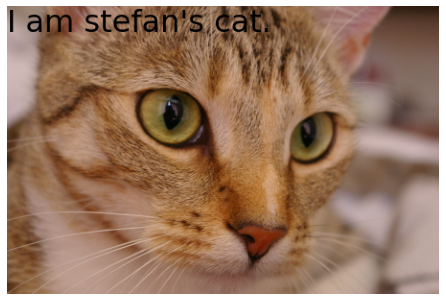

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data

img = data.cat()

fig = plt.figure()
fig.figimage(img, resize=True)
fig.text(0, 0.99, "I am stefan's cat.", fontsize=32, va="top")
fig.canvas.draw()
annotated_img = np.asarray(fig.canvas.renderer.buffer_rgba())
plt.close(fig)

fig, ax = plt.subplots()
ax.imshow(annotated_img)
ax.set_axis_off()
ax.set_position([0, 0, 1, 1])
plt.show()

# Remove background application


https://twitter.com/clcoding/status/1578192383144910848?t=qTgxx3ethnPcqrK6q57kaQ&s=08

https://www.remove.bg/es

In [ ]:
!pip install pillow
!pip install rembg

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Para acceder a Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Path de la carpeta donde tenemos las imágenes
folder = "/content/drive/My Drive/UPSO/Clases/DataPandas/imgs/"

In [ ]:
# Importar paquetes
from rembg import remove
from PIL import Image #Pillow

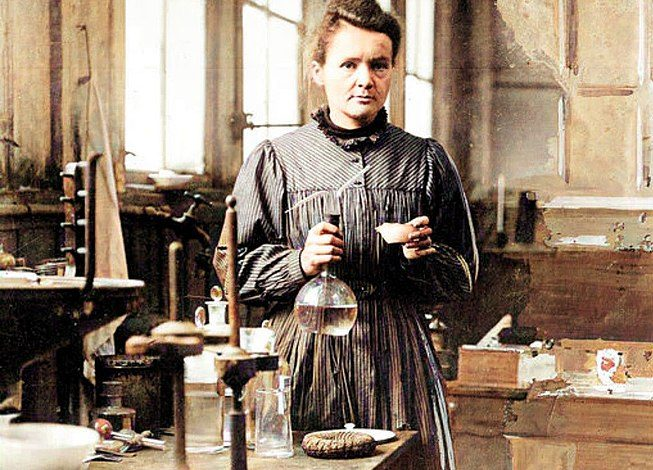

In [ ]:
marie = Image.open(folder + 'MarieCurie.jpeg') #madryn.jpg
marie

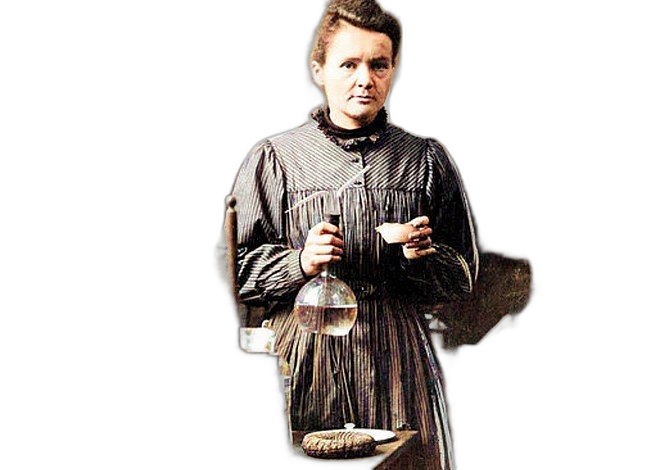

In [ ]:
sin_fondo = remove(marie)
sin_fondo

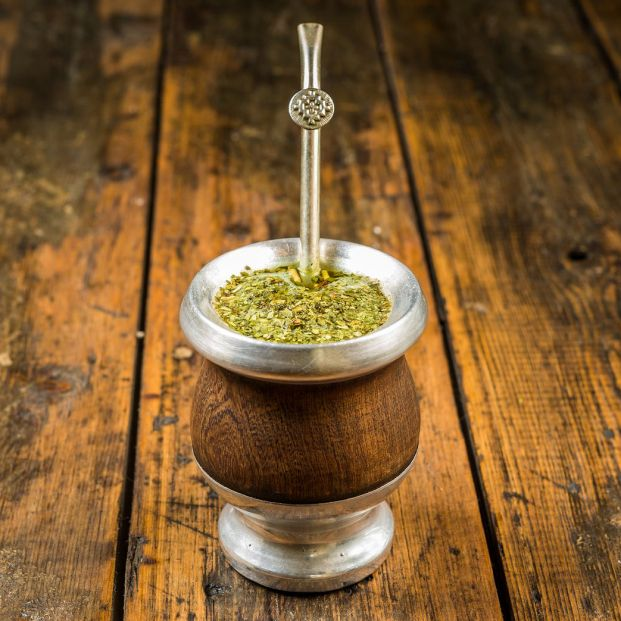

In [ ]:
mate = Image.open(folder + 'mate.jpeg')
mate

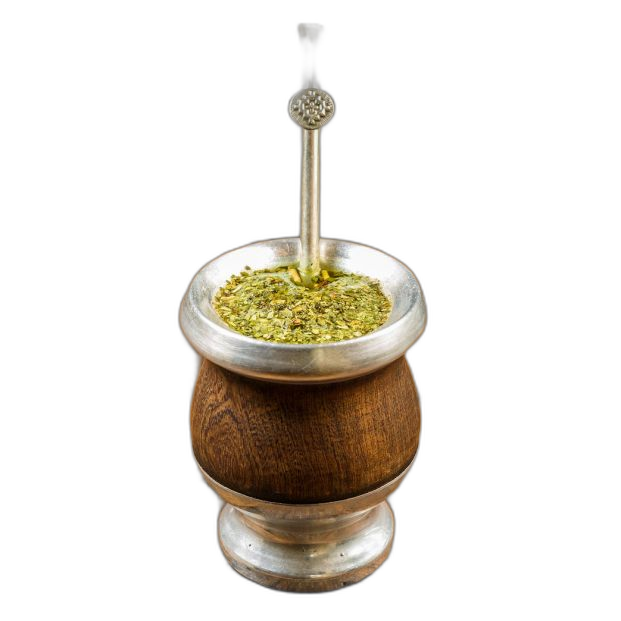

In [ ]:
mate_sin_fondo = remove(mate)
mate_sin_fondo